In [2]:
import numpy as np
import pandas as pd
import cv2 as cv
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pyplot import figure

figure(figsize=(15, 12), dpi=80)

<Figure size 1200x960 with 0 Axes>

<Figure size 1200x960 with 0 Axes>

(512, 512, 3)


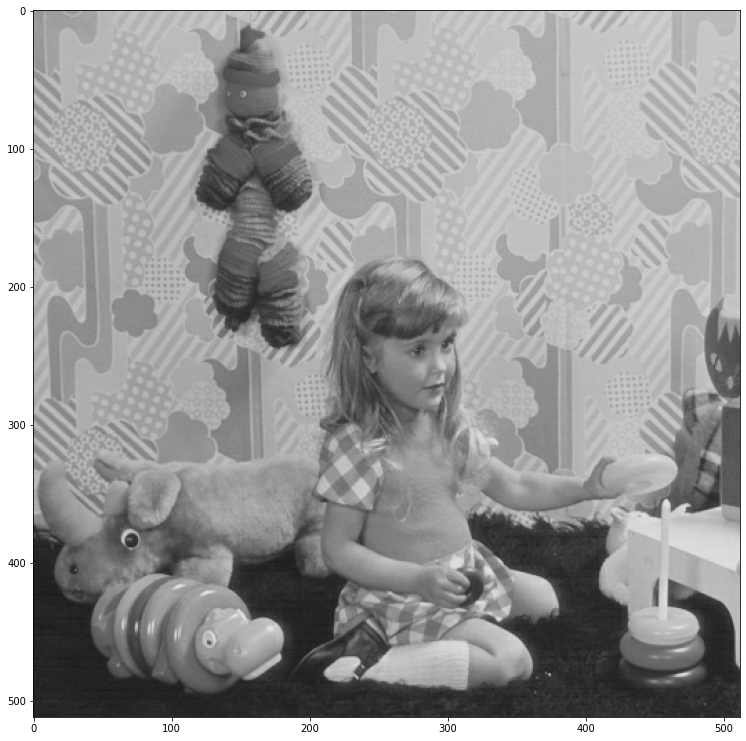

In [3]:
image = cv.imread('./images/isabelle.bmp')
plt.figure(figsize=(13,13))
plt.imshow(image,cmap = 'gray')
print(image.shape)

(512, 512)


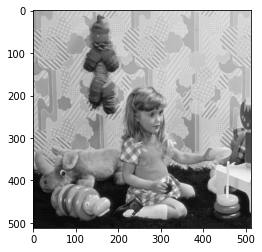

In [4]:
img = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
print(img.shape)
plt.imshow(img, cmap='gray')

(<AxesSubplot:>, <matplotlib.image.AxesImage at 0x169f6f19b40>)

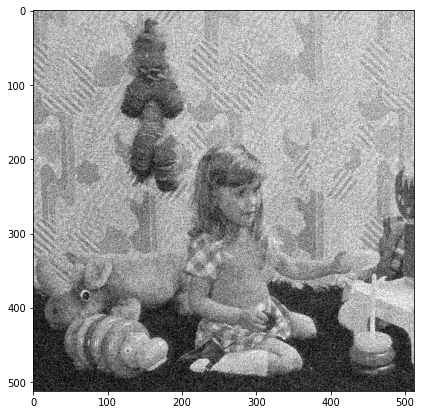

In [5]:
def noise(imgg, mu, sigma):
    h, l = imgg.shape
    gaussian = np.random.normal(mu, sigma, img.shape)*255
    noise = imgg+gaussian
    for i in range(0, h):
        for j in range(0, l):
            if noise[i, j] < 0:
                noise[i, j] = 0
            elif noise[i, j] > 255:
                noise[i, j] = 255
            else:
                noise[i, j] = noise[i, j]
    noise = np.uint8(noise)
    return noise
noised_image = noise(img, 0, 0.1)
plt.figure(figsize=(15,15))
plt.subplot(121),plt.imshow(noised_image,cmap='gray')
#plt.subplot(122),plt.imshow(noised_image2,cmap='gray')

Filtre Moyenneur


(512, 512)


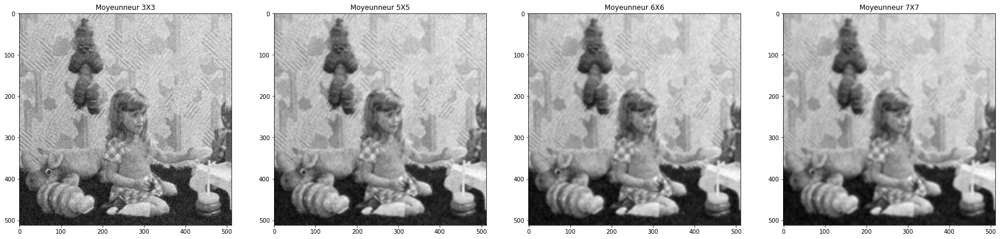

In [6]:
blur3X3 = cv.blur(noised_image,(3,3)) # Blur 3x3
blur5X5 = cv.blur(noised_image,(5,5)) #blur 10x10
blur6X6 = cv.blur(noised_image,(6,6)) #blur 10x10
blur7X7 = cv.blur(noised_image,(7,7)) #blur 10x10
plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(blur3X3,cmap = "gray"),plt.title("Moyeunneur 3X3")
plt.subplot(142),plt.imshow(blur5X5,cmap = "gray"),plt.title("Moyeunneur 5X5")
plt.subplot(143),plt.imshow(blur6X6,cmap = "gray"),plt.title("Moyeunneur 6X6")
plt.subplot(144),plt.imshow(blur7X7,cmap = "gray"),plt.title("Moyeunneur 7X7")
print(blur3X3.shape)

(<AxesSubplot:>, <matplotlib.image.AxesImage at 0x169f7f4d420>)

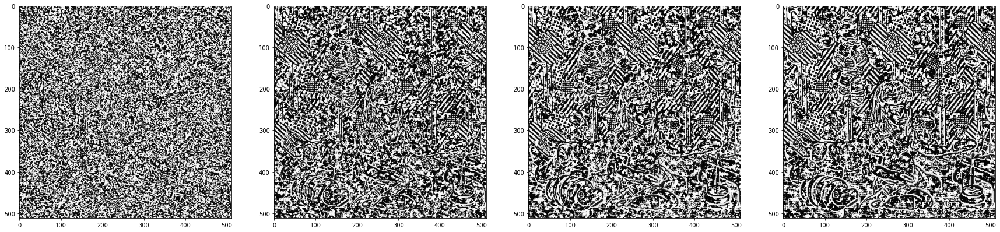

In [7]:
soustraction1 = -img + blur3X3
soustraction2 = img - blur5X5
soustraction3 = img - blur6X6
soustraction4 = img - blur7X7
plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(soustraction1,cmap='gray')
plt.subplot(142),plt.imshow(soustraction2,cmap='gray')
plt.subplot(143),plt.imshow(soustraction3,cmap='gray')
plt.subplot(144),plt.imshow(soustraction4,cmap='gray')

Filtrage Gaussian

(<AxesSubplot:title={'center':'sigma 2 ideal 13X13'}>,
 Text(0.5, 1.0, 'sigma 2 ideal 13X13'))

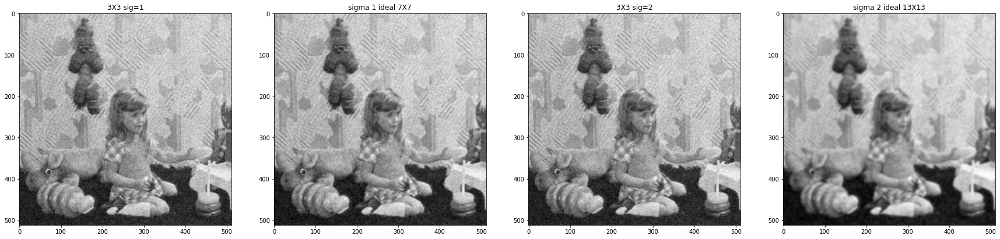

In [8]:
dst2 = cv.GaussianBlur(noised_image,(3,3),2)
dst7x7 = cv.GaussianBlur(noised_image,(13,13),2)
dst = cv.GaussianBlur(noised_image,(3,3),1)
dst7x77 = cv.GaussianBlur(noised_image,(7,7),1)
plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(dst, cmap='gray'),plt.title("3X3 sig=1")
plt.subplot(142),plt.imshow(dst7x77, cmap='gray'),plt.title("sigma 1 ideal 7X7")
plt.subplot(143),plt.imshow(dst2, cmap='gray'),plt.title("3X3 sig=2")
plt.subplot(144),plt.imshow(dst7x7, cmap='gray'),plt.title("sigma 2 ideal 13X13")

Filtre Median

(<AxesSubplot:title={'center':'9X9'}>,
 Text(0.5, 1.0, '9X9'))

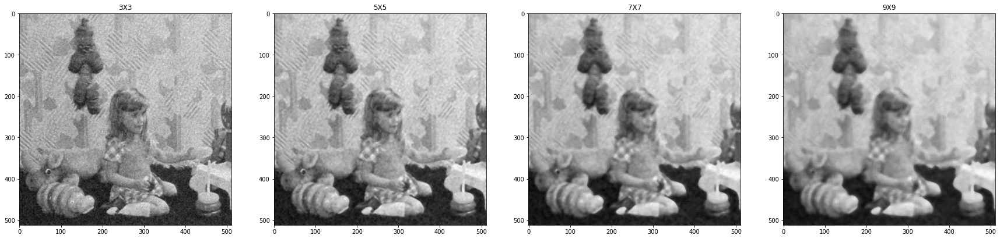

In [9]:
med3X3 = cv.medianBlur(noised_image,3)
med5X5 = cv.medianBlur(noised_image,5)
med7X7 = cv.medianBlur(noised_image,7)
med9X9 = cv.medianBlur(noised_image,9)
plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(med3X3,cmap = "gray"),plt.title("3X3")
plt.subplot(142),plt.imshow(med5X5,cmap = "gray"),plt.title("5X5")
plt.subplot(143),plt.imshow(med7X7,cmap = "gray"),plt.title("7X7")
plt.subplot(144),plt.imshow(med9X9,cmap = "gray"),plt.title("9X9")



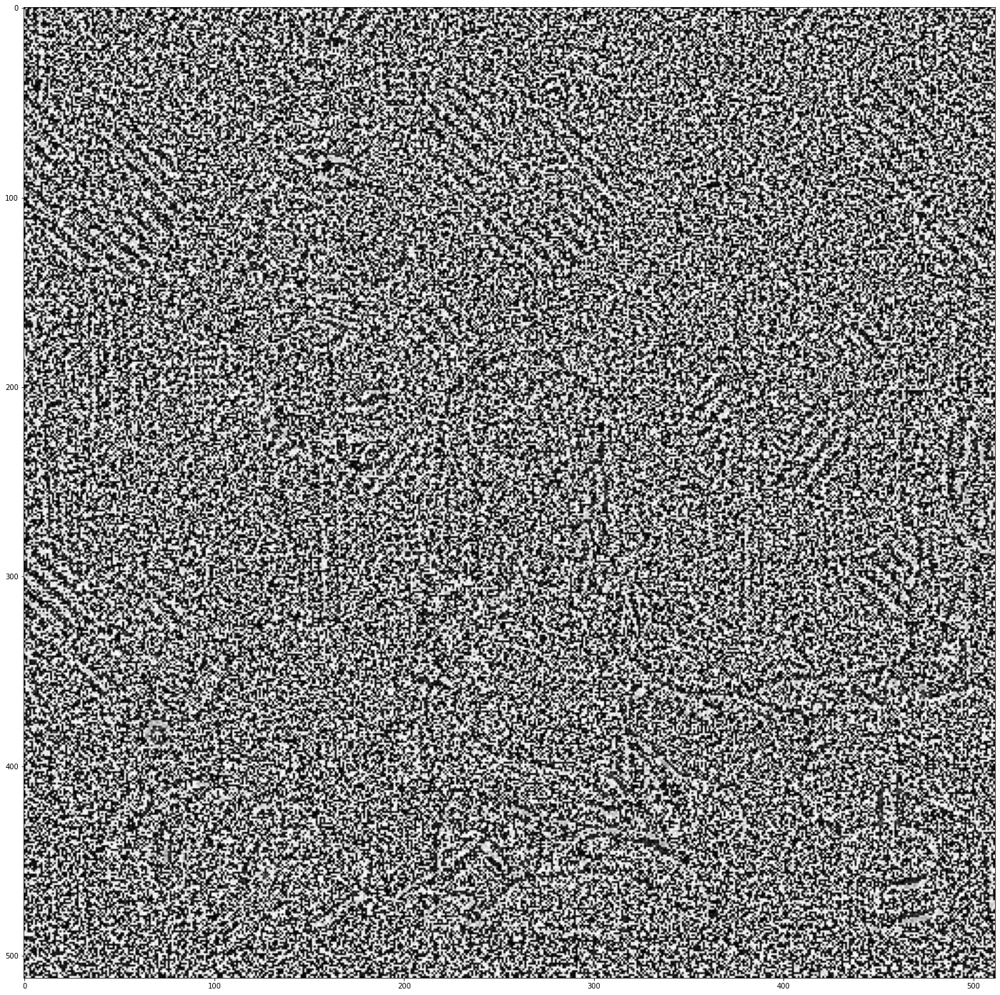

In [10]:
#soustraction
sous = med7X7 - noised_image
plt.figure(figsize=(25,25))
plt.imshow(sous,cmap='gray')

Bruit Impulsionnele


In [11]:
def impulse(img,amount):
    row,col = img.shape
    s_vs_p = 0.5
    out = np.copy(img)
    # Salt mode
    num_salt = np.ceil(amount * img.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt))
    for i in img.shape]
    out[coords] = 255
    # Pepper mode
    num_pepper = np.ceil(amount* img.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
    for i in img.shape]
    out[coords] = 0
    return out

C:\Users\asus zephyrus\AppData\Local\Temp\ipykernel_4080\2356614518.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 255
C:\Users\asus zephyrus\AppData\Local\Temp\ipykernel_4080\2356614518.py:14: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 0


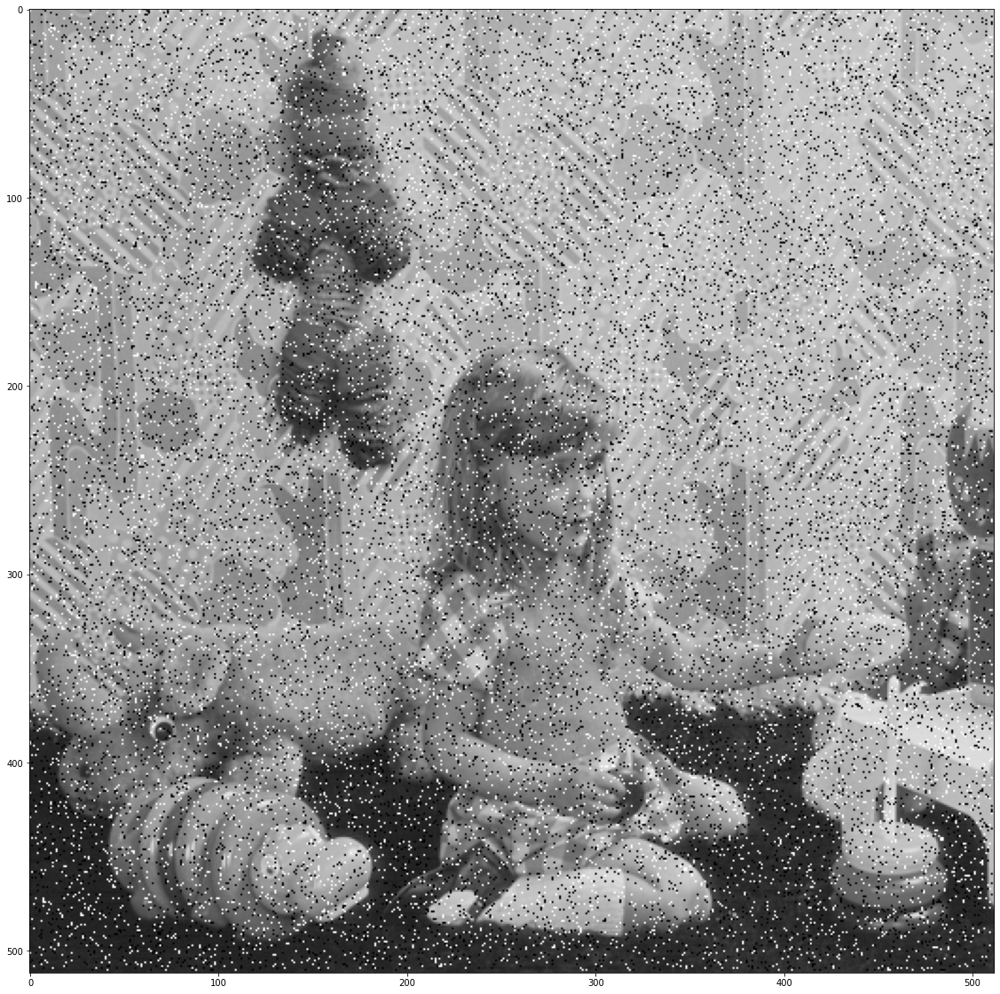

In [12]:
impul_image = impulse(img,0.1)
plt.figure(figsize=(20,20))
plt.imshow(impul_image,cmap = "gray")

(<AxesSubplot:title={'center':'9X9'}>,
 Text(0.5, 1.0, '9X9'))

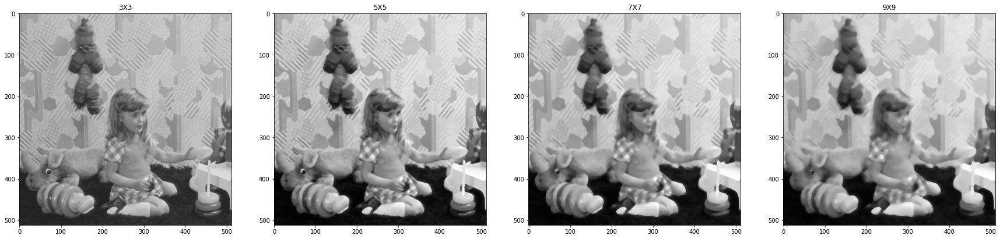

In [13]:
med3X3i = cv.medianBlur(impul_image,3)
med5X5i = cv.medianBlur(impul_image,5)
med7X7i = cv.medianBlur(impul_image,7)
med9X9i = cv.medianBlur(impul_image,9)
plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(med3X3i,cmap = "gray"),plt.title("3X3")
plt.subplot(142),plt.imshow(med5X5i,cmap = "gray"),plt.title("5X5")
plt.subplot(143),plt.imshow(med7X7i,cmap = "gray"),plt.title("7X7")
plt.subplot(144),plt.imshow(med9X9i,cmap = "gray"),plt.title("9X9")

(<AxesSubplot:title={'center':'sigma 2 ideal 13X13'}>,
 Text(0.5, 1.0, 'sigma 2 ideal 13X13'))

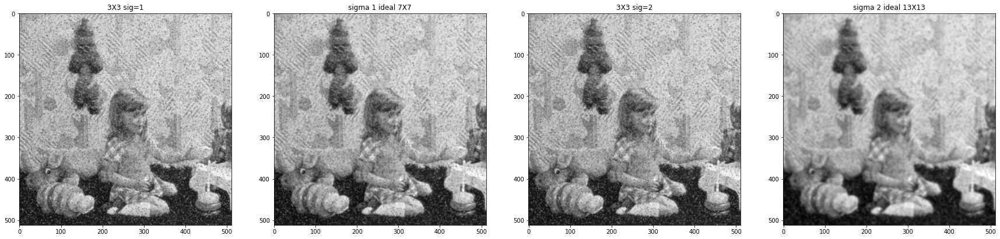

In [14]:
dst2i = cv.GaussianBlur(impul_image,(3,3),2)
dst7x7i = cv.GaussianBlur(impul_image,(13,13),2)
dsti = cv.GaussianBlur(impul_image,(3,3),1)
dst7x77i = cv.GaussianBlur(impul_image,(7,7),1)
plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(dsti, cmap='gray'),plt.title("3X3 sig=1")
plt.subplot(142),plt.imshow(dst7x77i, cmap='gray'),plt.title("sigma 1 ideal 7X7")
plt.subplot(143),plt.imshow(dst2i, cmap='gray'),plt.title("3X3 sig=2")
plt.subplot(144),plt.imshow(dst7x7i, cmap='gray'),plt.title("sigma 2 ideal 13X13")

(<AxesSubplot:title={'center':'Moyeunneur 7X7'}>,
 Text(0.5, 1.0, 'Moyeunneur 7X7'))

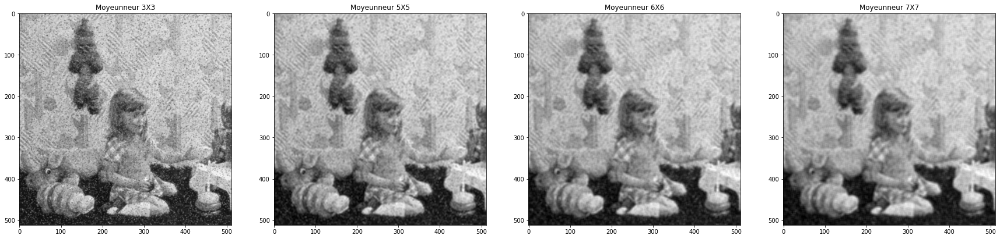

In [15]:
blur3X3i = cv.blur(impul_image,(3,3)) # Blur 3x3
blur5X5i = cv.blur(impul_image,(5,5)) #blur 10x10
blur6X6i = cv.blur(impul_image,(6,6)) #blur 10x10
blur7X7i = cv.blur(impul_image,(7,7)) #blur 10x10
plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(blur3X3i,cmap = "gray"),plt.title("Moyeunneur 3X3")
plt.subplot(142),plt.imshow(blur5X5i,cmap = "gray"),plt.title("Moyeunneur 5X5")
plt.subplot(143),plt.imshow(blur6X6i,cmap = "gray"),plt.title("Moyeunneur 6X6")
plt.subplot(144),plt.imshow(blur7X7i,cmap = "gray"),plt.title("Moyeunneur 7X7")

C:\Users\asus zephyrus\AppData\Local\Temp\ipykernel_4080\2356614518.py:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 255
C:\Users\asus zephyrus\AppData\Local\Temp\ipykernel_4080\2356614518.py:14: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 0


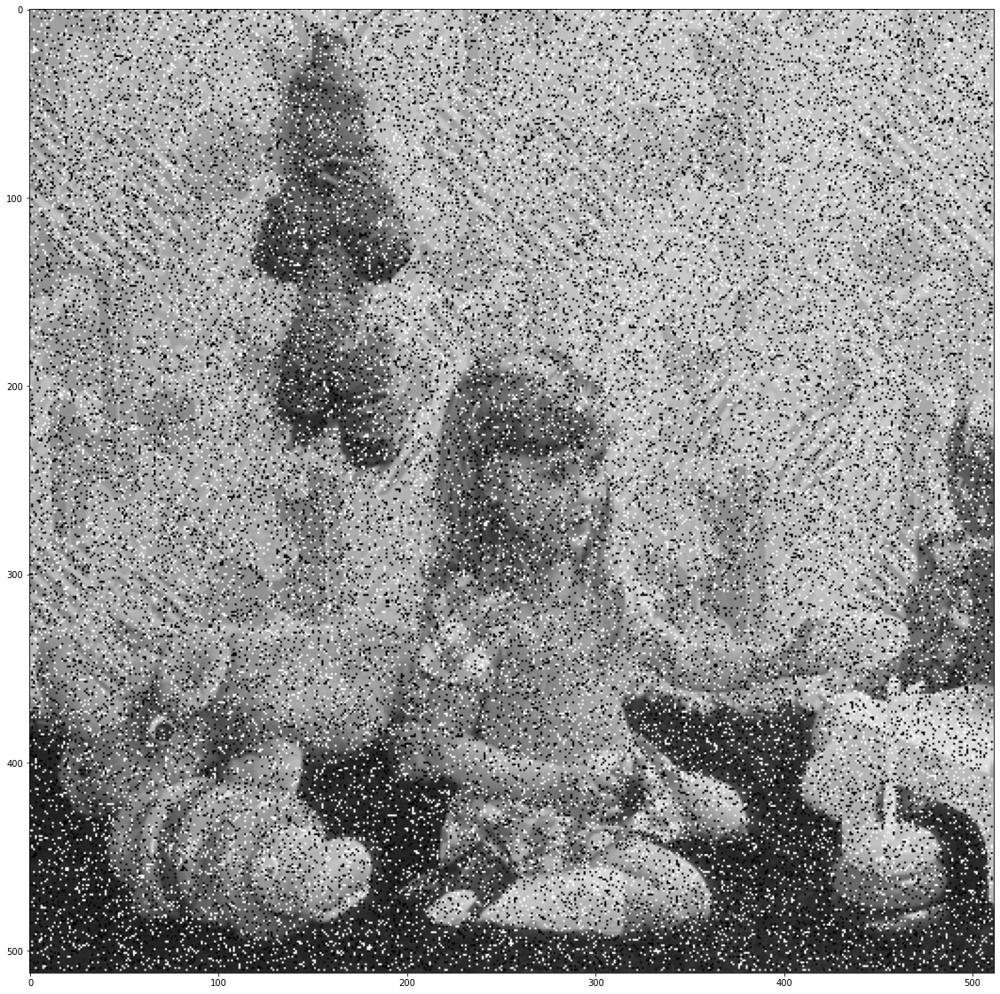

In [16]:
imgg11 = impulse(img,0.2)
plt.figure(figsize=(20,20))
plt.imshow(imgg11,cmap='gray')

(<AxesSubplot:title={'center':'9X9'}>,
 Text(0.5, 1.0, '9X9'))

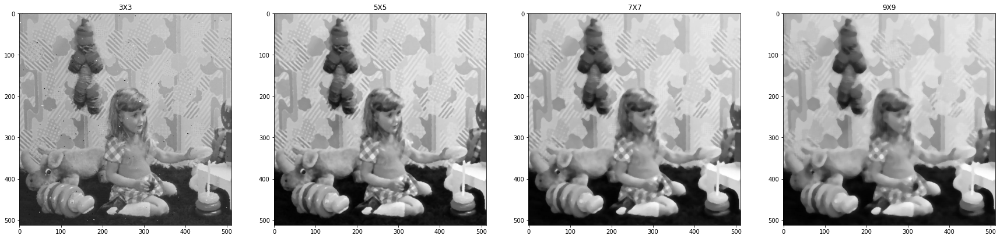

In [17]:
med3X3ii = cv.medianBlur(imgg11,3)
med5X5ii = cv.medianBlur(imgg11,5)
med7X7ii = cv.medianBlur(imgg11,7)
med9X9ii = cv.medianBlur(imgg11,9)
plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(med3X3ii,cmap = "gray"),plt.title("3X3")
plt.subplot(142),plt.imshow(med5X5ii,cmap = "gray"),plt.title("5X5")
plt.subplot(143),plt.imshow(med7X7ii,cmap = "gray"),plt.title("7X7")
plt.subplot(144),plt.imshow(med9X9ii,cmap = "gray"),plt.title("9X9")